<a href="https://colab.research.google.com/github/marwa189/cervical-cancer-risk-prediction/blob/main/eda_and_preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Cervical Cancer Risk Prediction

## Objective
# This project aims to analyze a cervical cancer dataset and apply machine learning techniques to predict cervical cancer risk.

## Workflow
# 1. Dataset understanding
# 2. Data cleaning
# 3. Exploratory Data Analysis
# 4. Preprocessing
# 5. Model training
# 6. Evaluation

In [2]:
# import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


In [3]:
# read dataset
df=pd.read_csv("risk_factors_cervical_cancer.csv")


In [4]:
df.head()

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs: Time since first diagnosis,STDs: Time since last diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
0,18,4.0,15.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,0,0,0,0,0,0,0,0
1,15,1.0,14.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,0,0,0,0,0,0,0,0
2,34,1.0,?,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,0,0,0,0,0,0,0,0
3,52,5.0,16.0,4.0,1.0,37.0,37.0,1.0,3.0,0.0,...,?,?,1,0,1,0,0,0,0,0
4,46,3.0,21.0,4.0,0.0,0.0,0.0,1.0,15.0,0.0,...,?,?,0,0,0,0,0,0,0,0


In [5]:
df.shape

(858, 36)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 858 entries, 0 to 857
Data columns (total 36 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   Age                                 858 non-null    int64 
 1   Number of sexual partners           858 non-null    object
 2   First sexual intercourse            858 non-null    object
 3   Num of pregnancies                  858 non-null    object
 4   Smokes                              858 non-null    object
 5   Smokes (years)                      858 non-null    object
 6   Smokes (packs/year)                 858 non-null    object
 7   Hormonal Contraceptives             858 non-null    object
 8   Hormonal Contraceptives (years)     858 non-null    object
 9   IUD                                 858 non-null    object
 10  IUD (years)                         858 non-null    object
 11  STDs                                858 non-null    object

In [7]:
df.describe()

,Age,STDs: Number of diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
count,858.000000,858.000000,858.000000,858.000000,858.000000,858.000000,858.000000,858.000000,858.000000,858.000000
mean,26.820513,0.087413,0.020979,0.010490,0.020979,0.027972,0.040793,0.086247,0.051282,0.064103
std,8.497948,0.302545,0.143398,0.101939,0.143398,0.164989,0.197925,0.280892,0.220701,0.245078
min,13.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,84.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [8]:
df.isna().sum()

,0
Age,0
Number of sexual partners,0
First sexual intercourse,0
Num of pregnancies,0
Smokes,0
Smokes (years),0
Smokes (packs/year),0
Hormonal Contraceptives,0
Hormonal Contraceptives (years),0
IUD,0


In [9]:
(df == "?").sum()

,0
Age,0
Number of sexual partners,26
First sexual intercourse,7
Num of pregnancies,56
Smokes,13
Smokes (years),13
Smokes (packs/year),13
Hormonal Contraceptives,108
Hormonal Contraceptives (years),108
IUD,117


In [10]:
# hidden missing values
df=df.replace("?",np.nan)

In [11]:
df.isna().sum()

,0
Age,0
Number of sexual partners,26
First sexual intercourse,7
Num of pregnancies,56
Smokes,13
Smokes (years),13
Smokes (packs/year),13
Hormonal Contraceptives,108
Hormonal Contraceptives (years),108
IUD,117


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 858 entries, 0 to 857
Data columns (total 36 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   Age                                 858 non-null    int64 
 1   Number of sexual partners           832 non-null    object
 2   First sexual intercourse            851 non-null    object
 3   Num of pregnancies                  802 non-null    object
 4   Smokes                              845 non-null    object
 5   Smokes (years)                      845 non-null    object
 6   Smokes (packs/year)                 845 non-null    object
 7   Hormonal Contraceptives             750 non-null    object
 8   Hormonal Contraceptives (years)     750 non-null    object
 9   IUD                                 741 non-null    object
 10  IUD (years)                         741 non-null    object
 11  STDs                                753 non-null    object

In [13]:
# change to numeric instead of obj caused by ?
for col in df.columns:
    df[col] = pd.to_numeric(df[col], errors='coerce')

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 858 entries, 0 to 857
Data columns (total 36 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Age                                 858 non-null    int64  
 1   Number of sexual partners           832 non-null    float64
 2   First sexual intercourse            851 non-null    float64
 3   Num of pregnancies                  802 non-null    float64
 4   Smokes                              845 non-null    float64
 5   Smokes (years)                      845 non-null    float64
 6   Smokes (packs/year)                 845 non-null    float64
 7   Hormonal Contraceptives             750 non-null    float64
 8   Hormonal Contraceptives (years)     750 non-null    float64
 9   IUD                                 741 non-null    float64
 10  IUD (years)                         741 non-null    float64
 11  STDs                                753 non-n

In [15]:
missing_percentage = (df.isna().sum() / len(df)) * 100
missing_percentage.sort_values(ascending=False)

,0
STDs: Time since first diagnosis,91.724942
STDs: Time since last diagnosis,91.724942
IUD,13.636364
IUD (years),13.636364
Hormonal Contraceptives,12.587413
Hormonal Contraceptives (years),12.587413
STDs:HPV,12.237762
STDs:AIDS,12.237762
STDs:Hepatitis B,12.237762
STDs:HIV,12.237762


In [16]:
df["Biopsy"].value_counts()

,count
Biopsy,
0,803
1,55


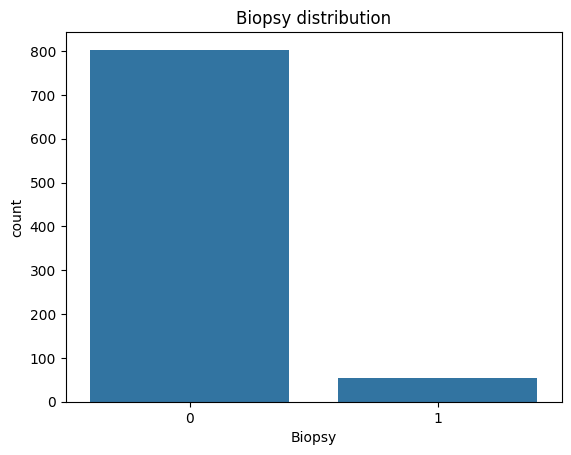

In [17]:
sns.countplot(x="Biopsy",data=df)
plt.title("Biopsy distribution")
plt.show()

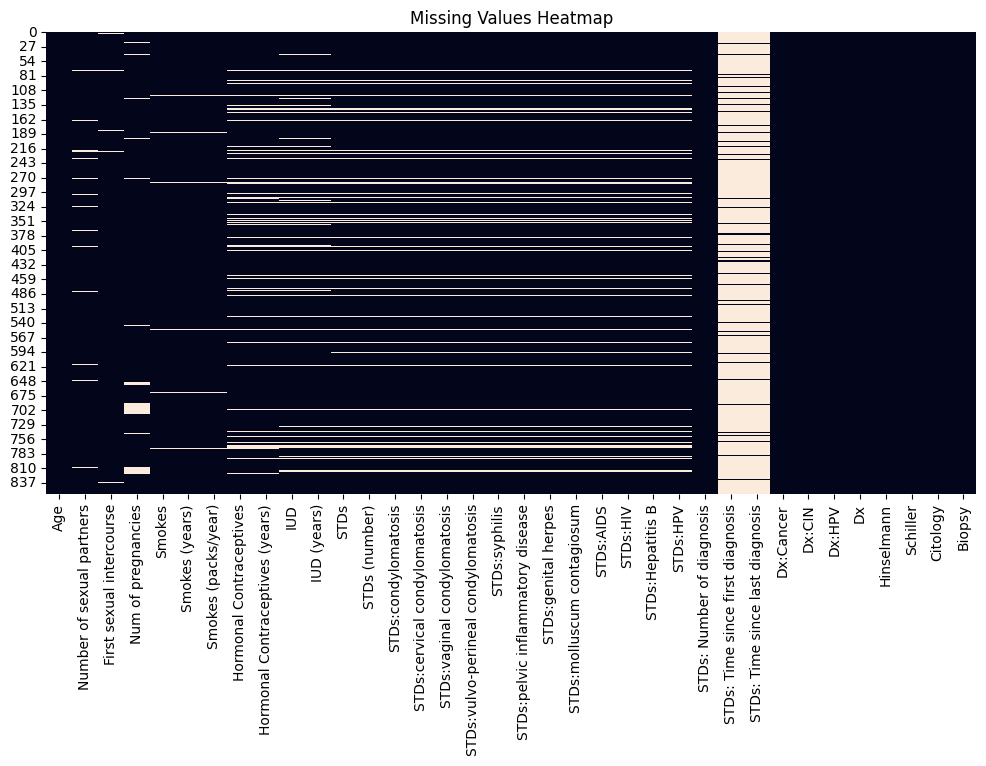

In [18]:
plt.figure(figsize=(12,6))
sns.heatmap(df.isnull(), cbar=False)
plt.title("Missing Values Heatmap")
plt.show()

In [19]:
! pip install ydata-profiling

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.8/400.8 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 20.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 58.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.7/679.7 kB 36.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 6.1 MB/s eta 0:00:00


In [20]:
from ydata_profiling import ProfileReport
profile=ProfileReport(
    df,
    title="Cervical Cancer EDA Report",
    explorative= True


)
profile.to_file("cervical_cancer_EDA.html")

/tmp/ipykernel_7786/1473899395.py:1: DeprecationWarning: 
    `import ydata_profiling` is deprecated and will not receive more updates. 
    Please install fg-data-profiling via `pip install fg-data-profiling` and use `import data_profiling` instead.
    
  from ydata_profiling import ProfileReport


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 36/36 [00:00<00:00, 42.32it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [21]:
profile

In [22]:
# Drop columns with extremely high missing values
df.drop(columns=[
    "STDs: Time since first diagnosis",
    "STDs: Time since last diagnosis"
], inplace=True)

In [23]:
# zero variance
constant_cols = [
    "STDs:cervical condylomatosis",
    "STDs:AIDS"
]

df.drop(columns=constant_cols, inplace=True)

In [24]:
missing_percentage = (df.isna().sum() / len(df)) * 100
missing_percentage.sort_values(ascending=False)

,0
IUD (years),13.636364
IUD,13.636364
Hormonal Contraceptives,12.587413
Hormonal Contraceptives (years),12.587413
STDs,12.237762
STDs:vaginal condylomatosis,12.237762
STDs:condylomatosis,12.237762
STDs (number),12.237762
STDs:vulvo-perineal condylomatosis,12.237762
STDs:HPV,12.237762


In [25]:
#measure skewness
numerical_cols = [
    "Age",
    "Number of sexual partners",
    "First sexual intercourse",
    "Num of pregnancies",
    "Smokes (years)",
    "Smokes (packs/year)",
    "IUD (years)",
    "Hormonal Contraceptives (years)",
    "STDs (number)"
]

df[numerical_cols].skew()

,0
Age,1.394279
Number of sexual partners,5.454649
First sexual intercourse,1.564375
Num of pregnancies,1.423514
Smokes (years),4.465484
Smokes (packs/year),9.308806
IUD (years),5.001759
Hormonal Contraceptives (years),2.626438
STDs (number),3.402849


In [26]:
# Save a Copy Before Imputation
df_before_imputation = df.copy()

In [27]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
df_imputed = pd.DataFrame(
    imputer.fit_transform(df),
    columns=df.columns
)

In [28]:
df_imputed.isna().sum().sort_values(ascending=False)

,0
Age,0
Number of sexual partners,0
First sexual intercourse,0
Num of pregnancies,0
Smokes,0
Smokes (years),0
Smokes (packs/year),0
Hormonal Contraceptives,0
Hormonal Contraceptives (years),0
IUD,0


In [29]:
#duplicate rows
df_imputed.duplicated().sum()

np.int64(25)

In [30]:
#remove duplicated rows
df_imputed.drop_duplicates(inplace=True)

In [31]:
# count biopsy imbalance
df_imputed["Biopsy"].value_counts()


,count
Biopsy,
0.0,779
1.0,54


In [32]:
# Remove highly target-related diagnostic test features
# to focus on underlying patient risk factors
df.drop(columns=["Hinselmann", "Schiller", "Citology"], inplace=True)

In [33]:
df = df_imputed.copy()

In [34]:
# define features and target
X = df.drop("Biopsy", axis=1)
y = df["Biopsy"]

In [38]:
# imbalance percentage for biopsy classes
y.value_counts(normalize=True) * 100

,proportion
Biopsy,
0.0,93.517407
1.0,6.482593


In [39]:
#train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
